#### $\texttt{TM0 light curve - soft proton flare flitering}$

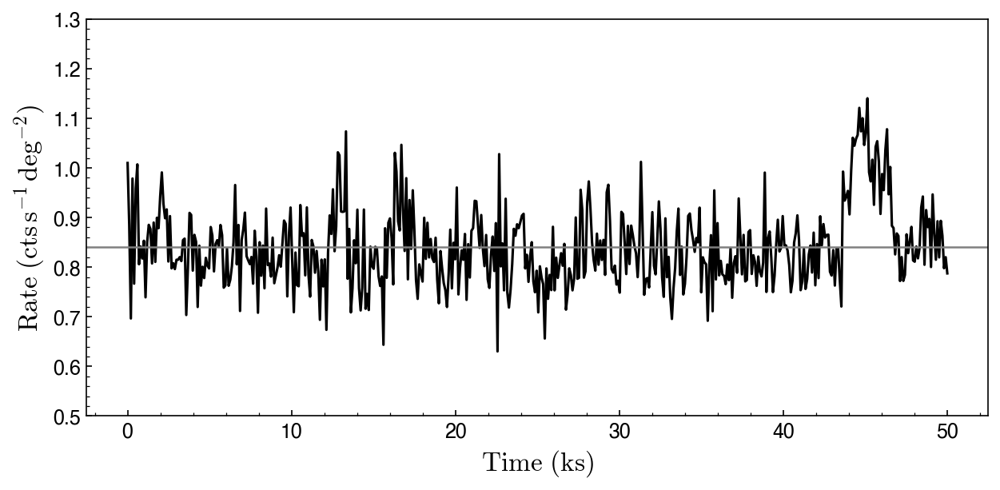

In [889]:
import os
import numpy as np
import pylab as pl
import matplotlib as mpl
from astropy.io import fits
from astropy.wcs import WCS
import matplotlib.pyplot as plt 
import astropy.units as u
import astropy.constants as cc
from astropy.io import fits 
from astropy.cosmology import WMAP9 as cosmo
from astropy.visualization import PowerStretch 
from astropy.visualization.mpl_normalize import ImageNormalize, simple_norm
from astropy.visualization import PercentileInterval 
from scipy import interpolate
from scipy.optimize import curve_fit
mpl.rc('xtick',direction='in') 
from matplotlib.patches import Ellipse
mpl.rc('xtick',direction='in') 
mpl.rc('ytick',direction='in') 
mpl.rcParams['contour.negative_linestyle'] = 'solid' 
plt.rc('font',family='sans-serif',serif='Helvetica',size=10) 
params = {'text.usetex': False, 'mathtext.fontset': 'cm', 'mathtext.default': 'regular'} 
plt.rcParams.update(params) 
mpl.rcParams['figure.dpi'] = 150
mpl.rc('xtick',direction='in') 
mpl.rc('xtick',direction='in') 
mpl.rc('ytick',direction='in') 
pl.rcParams["xtick.minor.visible"] =  True
pl.rcParams["ytick.minor.visible"] =  True

mpl.rcParams['font.size'] = 12
mpl.rcParams['xtick.labelsize'] = 12  
mpl.rcParams['ytick.labelsize'] = 12
mpl.rcParams['font.family'] = 'serif'
#plt.rc('font',family='sans-serif',serif='Helvetica',size=10) 
params = {'text.usetex': False, 'mathtext.fontset': 'cm', 'mathtext.default': 'regular'} 
plt.rcParams.update(params) 


light_curve = fits.open('data/full_eband/light_curves/tm0_light_curve.fits')

time = np.linspace(0, 50, len(light_curve[1].data['RATE']))
pl.plot(time, light_curve[1].data['RATE'], 'k-')
pl.axhline(np.mean(light_curve[1].data['RATE']), color='grey', linestyle='-', linewidth=1.2)
pl.xlabel(r'$\rm Time\ (ks)$', fontsize=16)
pl.ylabel(r'$\rm Rate\ (cts\,s^{-1}\,deg^{-2})$', fontsize=16)
pl.subplots_adjust(right=1.3, top=.8)
pl.ylim([0.5, 1.3])
pl.savefig('figures/tm0_light_curve.pdf', format='pdf', dpi=150, bbox_inches='tight')
plt.show()


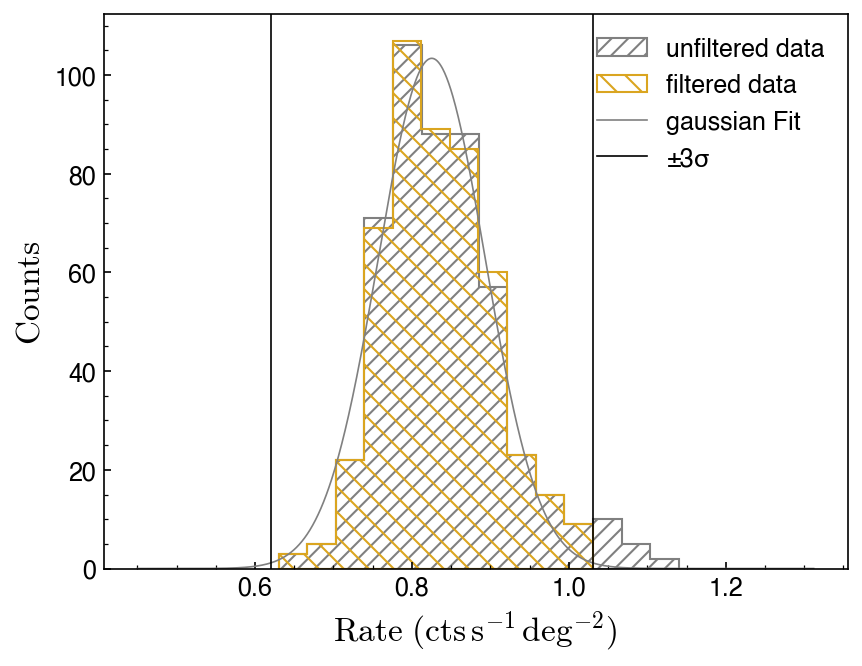

In [890]:
import numpy as np
import matplotlib.pyplot as pl
from scipy.optimize import curve_fit
from astropy.io import fits

def func(x, a, x0, sigma):
    return a * np.exp(-(x - x0)**2 / (2 * sigma**2))

light_curve = fits.open('data/full_eband/light_curves/tm0_light_curve.fits')
rate_data = light_curve[1].data['RATE']

bins = np.linspace(np.min(rate_data), np.max(rate_data), 15)
hist = pl.hist(rate_data, bins=bins, histtype='stepfilled',
                fill=False, edgecolor='grey', hatch='///', label='unfiltered data')
x, y = (hist[1][1:] + hist[1][:-1]) / 2, hist[0]

a, x0, sig = np.max(y), np.mean(x), np.std(x)
popt, cov = curve_fit(func, x, y, p0=[a, x0, sig])

a_new, x0_new, sig_new = np.max(y), np.mean(x), np.std(x)
popt_new, cov_new = curve_fit(func, x, y, p0=[a, x0, sig])
x_mock = np.linspace(0.45, np.max(x) + 0.3, 1000)

lower_bound = popt[1] - 3 * popt[-1]
upper_bound = popt[1] + 3 * popt[-1]

# filter RATE data within 3σ
mask = (rate_data >= lower_bound) & (rate_data <= upper_bound)
filtered_rate = rate_data[mask]

bins = np.linspace(np.min(filtered_rate), np.max(filtered_rate), 12)
hist_filtered = pl.hist(filtered_rate, bins=bins, histtype='stepfilled',
                fill=False, edgecolor='goldenrod', hatch='\\\\', label='filtered data')
x_filtered, y_filtered = (hist_filtered[1][1:] + hist_filtered[1][:-1]) / 2, hist_filtered[0]

a_new, x0_new, sig_new = np.max(y_filtered), np.mean(x_filtered), np.std(x_filtered)
popt_new, cov_new = curve_fit(func, x_filtered, y_filtered, p0=[a_new, x0_new, sig_new])

# Plot the new fit
x_mock = np.linspace(0.45, np.max(x_filtered) + 0.3, 1000)
pl.plot(x_mock, func(x_mock, *popt_new), ls='-', color='grey', linewidth=0.8, label='gaussian Fit')
pl.axvline(popt_new[1] + 3 * popt_new[-1], color='k', linewidth=0.8, ls='-', label='±3σ')
pl.axvline(popt_new[1] - 3 * popt_new[-1], color='k', linewidth=0.8, ls='-')
pl.xlabel(r'$\rm Rate\ (cts\,s^{-1}\,deg^{-2})$', fontsize=16)
pl.ylabel(r'$\rm Counts$', fontsize=16)
pl.legend(frameon=False, fontsize=12)
pl.savefig('figures/tm0_hist_filter.pdf', format='pdf', dpi=150, bbox_inches='tight')
pl.show()

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
Set MJD-OBS to 58767.375556 from DATE-OBS.
Set MJD-END to 58767.957789 from DATE-END'. [astropy.wcs.wcs]


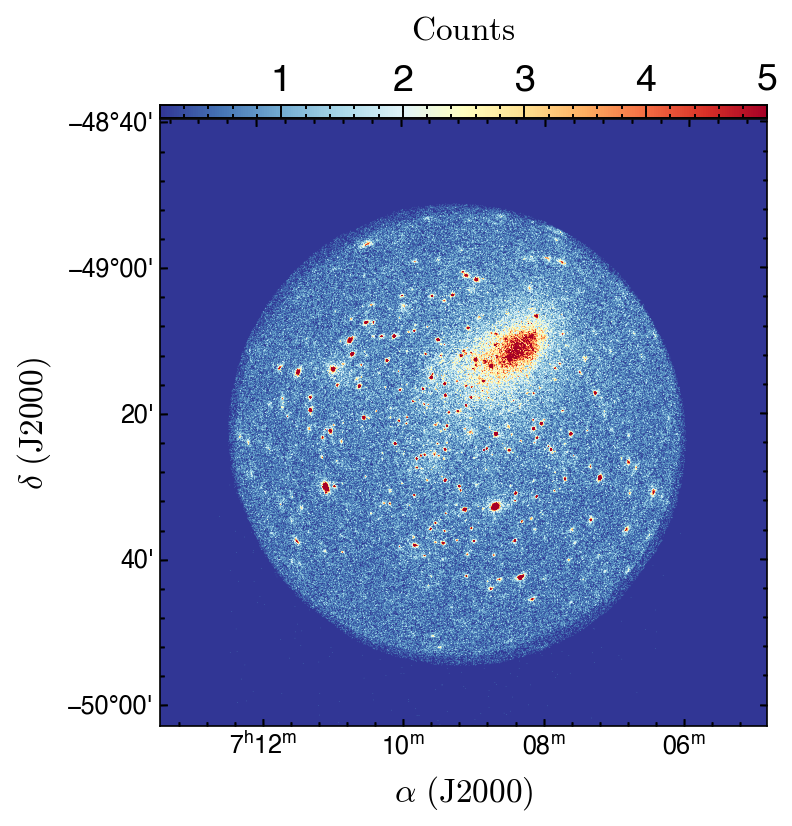

In [891]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
cleaned_tm0 = fits.open('data/full_eband/tm0_eventfile_cleaned.fits')
data = cleaned_tm0[0].data.astype(float)
wcs = WCS(cleaned_tm0[0].header)

fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(1, 1, 1, projection=wcs)

img = ax.imshow(data, origin='lower', vmin=0.0022, vmax=5, cmap='RdYlBu_r')

divider = make_axes_locatable(ax)
cax2 = divider.new_vertical(size='2%', pad=0.01)
fig.add_axes(cax2)
cb = plt.colorbar(img, cax=cax2, orientation='horizontal')
cax2.grid(False)
cax2.tick_params(direction='in', labelsize=18)
cax2.coords[0].set_ticklabel_position('t')
cax2.coords[0].set_axislabel_position('t')
cax2.coords[1].set_ticks(alpha=0, color='w', size=0, values=[]*u.dimensionless_unscaled)
cax2.coords[0].set_axislabel(r'$\rm Counts $', fontsize=16)

ax.set_xlabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
ax.set_ylabel(r'$\rm \delta\ (J2000)$', fontsize=16)
pl.subplots_adjust(right=1.3, top=.8)
pl.savefig('figures/tm0_cleaned_photon_image.pdf', format='pdf', dpi=150, bbox_inches='tight')
pl.show()

In [892]:
import astropy.units as u
from astropy.coordinates import Angle

# MeerKAT pointing center
# reproject to the center of the field

ra_str = "07h08m31.7s"
dec_str = "-49d12m52s"

ra = Angle(ra_str, unit=u.hourangle)
dec = Angle(dec_str, unit=u.deg)

print(f"RA in decimal degrees: {ra.degree}")
print(f"Dec in decimal degrees: {dec.degree}")

RA in decimal degrees: 107.13208333333333
Dec in decimal degrees: -49.214444444444446


#### $\texttt{TM0 photon image - energy range : 0.2 - 10 keV with MeerKAT detections}$

Set OBSGEO-B to   -30.713200 from OBSGEO-[XYZ].
Set OBSGEO-H to     1046.994 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
Set MJD-OBS to 58767.375556 from DATE-OBS.
Set MJD-END to 58767.957789 from DATE-END'. [astropy.wcs.wcs]


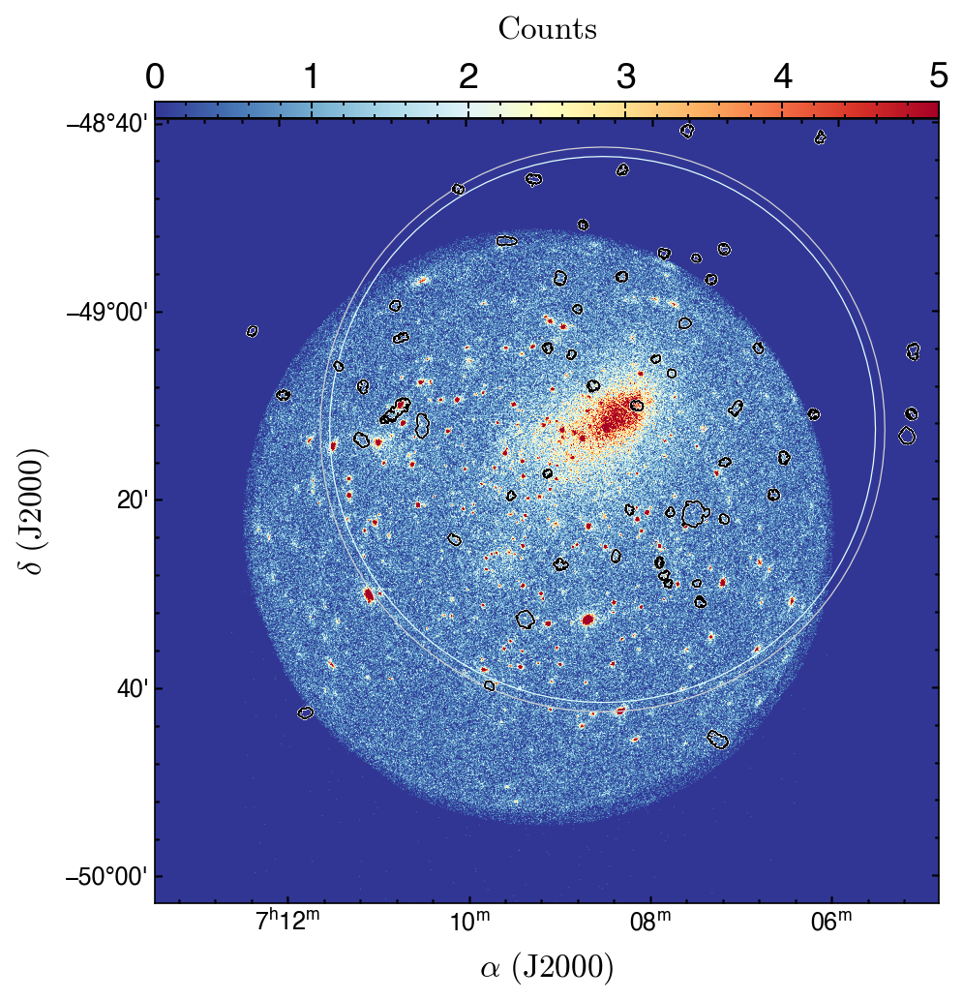

In [965]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from reproject import reproject_interp
from astropy.visualization.wcsaxes import SphericalCircle
from astropy.coordinates import SkyCoord

# Step 1: Load the FITS files
# Replace 'hi_image.fits' and 'xray_image.fits' with your actual file paths
hi_hdu = fits.open('data/full_eband/cluster_dilated_mom0.fits')[0]  # HI image (2600x2600)
xray_hdu = fits.open('data/full_eband/tm0_eventfile_cleaned.fits')[0]  # X-ray image (1250x1250)

# Extract data and WCS
hi_data = hi_hdu.data
hi_wcs = WCS(hi_hdu.header, naxis=2)
xray_data = xray_hdu.data
xray_wcs = WCS(xray_hdu.header)

# Step 2: Reproject the HI data to match the X-ray image's WCS and shape
# reproject_interp returns the reprojected data and a footprint (where data is valid)
hi_reprojected, footprint = reproject_interp(
    (hi_data, hi_wcs),  # Input data and WCS
    xray_wcs,  # Target WCS (X-ray)
    shape_out=xray_data.shape  # Target shape (1250x1250)
)

# Step 3: Create the plot
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection=xray_wcs)

#img = ax.imshow(xray_data, origin='lower', cmap='RdYlBu_r', vmin=np.nanpercentile(xray_data, 5), vmax=np.nanpercentile(xray_data, 95))
img = ax.imshow(xray_data, origin='lower', cmap='RdYlBu_r', vmax=5)
divider = make_axes_locatable(ax)
cax2 = divider.new_vertical(size='2%', pad=0.01)
fig.add_axes(cax2)
cb = plt.colorbar(img, cax=cax2, orientation='horizontal')
cax2.grid(False)
cax2.tick_params(direction='in', labelsize=18)
cax2.coords[0].set_ticklabel_position('t')
cax2.coords[0].set_axislabel_position('t')
cax2.coords[1].set_ticks(alpha=0, color='w', size=0, values=[]*u.dimensionless_unscaled)
cax2.coords[0].set_axislabel(r'$\rm Counts $', fontsize=16)

center = SkyCoord(ra=ra, dec=dec)

r_vir = SphericalCircle((center.ra, center.dec),
                        58/2 * u.arcmin,
                        edgecolor='lightcyan', facecolor='none',
                        transform=ax.get_transform('fk5'),
                        ls='-', linewidth=0.6)
ax.add_patch(r_vir)

beam = SphericalCircle((center.ra, center.dec),
                       30 * u.arcmin,
                       edgecolor='lightgrey', facecolor='none',
                       transform=ax.get_transform('fk5'),
                       ls='-', linewidth=0.6)
ax.add_patch(beam)

# step 4: Overlay HI contours
levels=[0.5, 1.5, 2.5, 3.5, 4.5]
ax.contour(hi_reprojected, levels=levels, colors='w', linewidths=1.2)
ax.contour(hi_reprojected, levels=levels, colors='k', linewidths=.6)

ax.set_xlabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
ax.set_ylabel(r'$\rm \delta\ (J2000)$', fontsize=16)

pl.subplots_adjust(right=1.3, top=.8)
pl.savefig('figures/hi_overlayed_xray.pdf', format='pdf', dpi=150, bbox_inches='tight')
pl.show()

#### $\texttt{TM0 photon image - energy range : 0.2 - 2.3 keV (TM8) \& 0.8 - 2.3 keV (TM9) }$

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
Set MJD-OBS to 58767.375556 from DATE-OBS.
Set MJD-END to 58767.957789 from DATE-END'. [astropy.wcs.wcs]


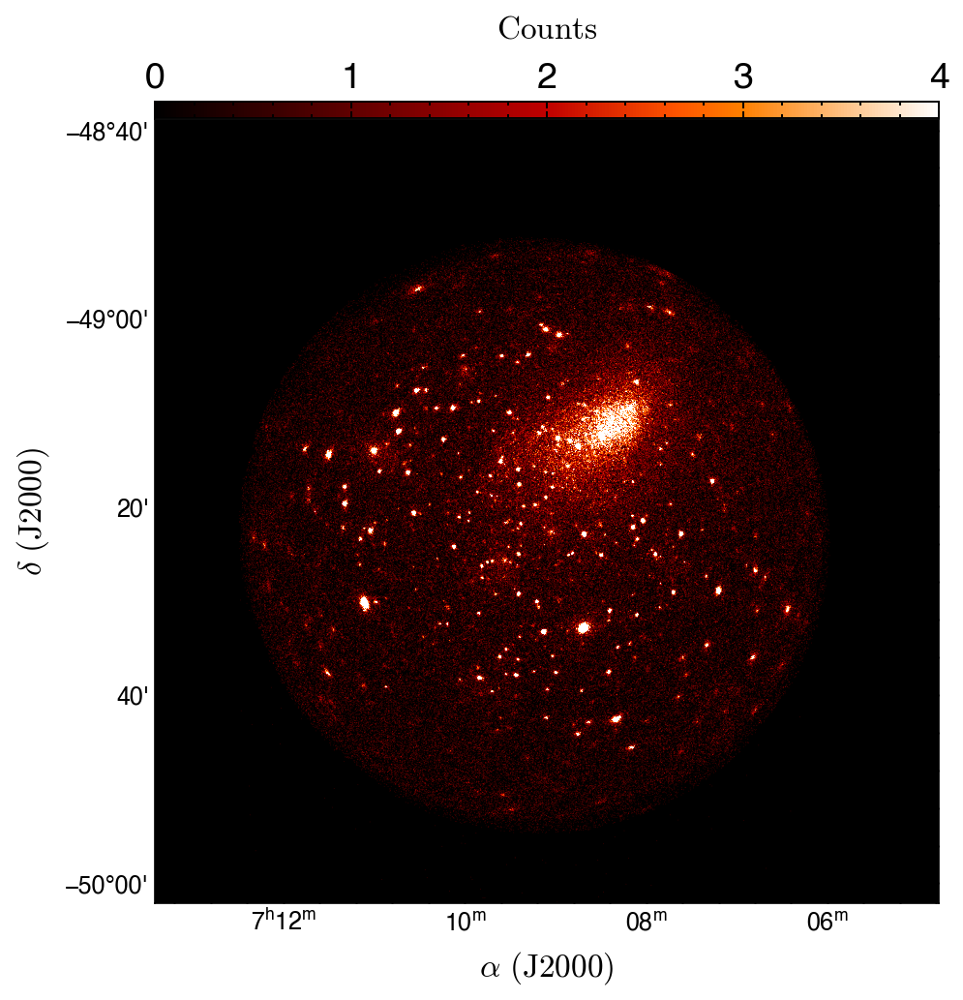

In [901]:
tm0_sband = fits.open('data/full_eband/tm0_sband_eventfile_cleaned.fits')[0]

data = tm0_sband.data.astype(float)
wcs = WCS(tm0_sband.header)
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(1, 1, 1, projection=wcs)
img = ax.imshow(data, origin='lower', vmax=4, cmap='gist_heat')
divider = make_axes_locatable(ax)
cax2 = divider.new_vertical(size='2%', pad=0.01)
fig.add_axes(cax2)
cb = plt.colorbar(img, cax=cax2, orientation='horizontal')
cax2.grid(False)
cax2.tick_params(direction='in', labelsize=18)
cax2.coords[0].set_ticklabel_position('t')
cax2.coords[0].set_axislabel_position('t')
cax2.coords[1].set_ticks(alpha=0, color='w', size=0, values=[]*u.dimensionless_unscaled)
cax2.coords[0].set_axislabel(r'$\rm Counts $', fontsize=16)
ax.set_xlabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
ax.set_ylabel(r'$\rm \delta\ (J2000)$', fontsize=16)
pl.subplots_adjust(right=1.3, top=.8)
pl.savefig('figures/tm0_sband_cleaned_photon_image.pdf', format='pdf', dpi=150, bbox_inches='tight')
pl.show()


#### $\texttt{PIB subtraction for TM0}$

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
Set MJD-OBS to 58767.375556 from DATE-OBS.
Set MJD-END to 58767.957789 from DATE-END'. [astropy.wcs.wcs]


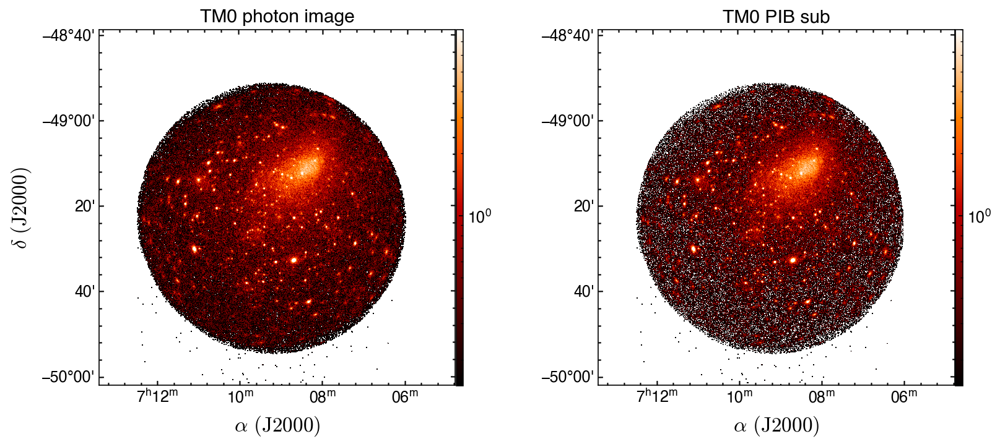

In [905]:

import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from astropy.io import fits
from astropy.wcs import WCS

# constants
energy_min = 5000  # lower bound in ev
energy_max = 9000  # upper bound in ev
tms = [1, 2, 5, 6, 7]  # telescope modules
data_dir = "data"
full_eband_dir = os.path.join(data_dir, "full_eband")
fwc_bkg_dir = os.path.join(data_dir, "fwc", "bkg_spec")
fwc_src_dir = os.path.join(data_dir, "fwc", "source_spec")
expmap_dir = os.path.join(data_dir, "expmaps")

filtered = fits.open('data/full_eband/tm0_eventfile_cleaned.fits')


events = filtered['EVENTS'].data

times = events['TIME']
energies = events['PI']
energy_cut = (energies >= 5000)&(energies <=9000)

x_time = times[energy_cut]

# load observation files
def load_observation_files():
    """load fits files for observations and exposure maps."""
    obs_files = [f for f in sorted(os.listdir(full_eband_dir)) if f.endswith('.fits')]
    if not obs_files:
        print("error: no fits files found in full_eband directory")
        return None, None, None
    obs = fits.open(os.path.join(full_eband_dir, "tm0_eventfile_cleaned.fits"))
    tm0_photon_image = fits.open(os.path.join(full_eband_dir, "tm0_sband_eventfile_cleaned.fits"))
    nonvign_expmap = fits.open(os.path.join(full_eband_dir, "tm0_nonvign_exposure_map.fits"))
    vign_expmap = fits.open(os.path.join(full_eband_dir, "tm0_vign_exposure_map.fits"))
    
    return tm0_photon_image, nonvign_expmap, vign_expmap, obs

# load fwc spectra and rmf
def load_fwc_files(tm):
    """load fwc source spectrum, background spectrum, and rmf for a given tm."""
    rmf_file = os.path.join(fwc_bkg_dir, f"pc00TM{tm}_FWC1.0_{tm}00_RMF_c946.fits")
    src_file = os.path.join(fwc_src_dir, f"TM{tm}_FWC_c010_{tm}20_SourceSpec_pat15.fits")
    bkg_file = os.path.join(fwc_bkg_dir, f"pc00TM{tm}_FWC1.0_{tm}00_BackgrSpec_c946.fits")
    
    for f in [rmf_file, src_file, bkg_file]:
        if not os.path.exists(f):
            print(f"error: file not found: {f}")
            return None, None, None
    
    rmf_data = fits.open(rmf_file)['EBOUNDS'].data
    src_spec = fits.open(src_file)['SPECTRUM'].data
    bkg_spec = fits.open(bkg_file)['SPECTRUM'].data
    
    return rmf_data, src_spec, bkg_spec

# process tm data
def process_tm_data(tm, obs, energy_min, energy_max):
    """process data for a single tm, computing hard and soft band counts."""
    events = obs['EVENTS'].data
    times = events['TIME']
    energies = events['PI']
    #gti = photon_image['FLAREGTI1'].data

    # define energy masks
    hband_mask = ((energies >= energy_min) & (energies <= energy_max))
    sband_mask = (energies >= (800 if tm in [5, 7] else 200)) & (energies <= 2300)
    
    # count hard band events
    filtered_times = times[hband_mask]
    hband_counts = len(filtered_times)
    #total_exposure = np.sum(gti['STOP'] - gti['START'])
    
    # load fwc data
    rmf_data, src_spec, bkg_spec = load_fwc_files(tm)
    if rmf_data is None:
        return None, None, None, None, hband_counts
    
    # compute fwc energy bins
    fwc_energies = (rmf_data['E_MIN'] + rmf_data['E_MAX']) / 2
    fwc_hband_mask = (fwc_energies >= 5.0) & (fwc_energies <= 9.0)
    fwc_sband_mask = (fwc_energies >= (0.8 if tm in [5, 7] else 0.2)) & (fwc_energies <= 2.3)
    
    return src_spec['COUNTS'], bkg_spec['COUNTS'], fwc_hband_mask, fwc_sband_mask, hband_counts

# create background map
def create_background_map(photon_image, nonvign_expmap, hband_counts, src_counts, hband_mask, sband_mask):
    """create a background map using exposure map and fwc spectra."""
    weighted_expmap = nonvign_expmap[0].data / 7
    h_pib = src_counts[hband_mask]
    s_pib = src_counts[sband_mask]
    
    # compute ratio of soft to hard band counts
    r = np.sum(s_pib) / np.sum(h_pib) if np.sum(h_pib) > 0 else 0
    
    # generate background map
    pib_map = (weighted_expmap / np.sum(weighted_expmap)) * hband_counts * r
    return pib_map

# plot results
def plot_results(photon_image, pib_map, vign_expmap):
    """plot original, background-subtracted, and exposure-corrected images."""
    wcs = WCS(photon_image[0].header)
    data = photon_image[0].data
    norm = LogNorm(vmin=0.15, vmax=8)
    
    plt.figure(figsize=(16, 8))
    
    # original photon image
    plt.subplot(131, projection=wcs)
    plt.title('TM0 photon image')
    plt.imshow(data, origin='lower',cmap='gist_heat', norm=norm)
    plt.colorbar(aspect=50, pad=0.002, fraction=0.0196)
    pl.ylabel(r'$\rm \delta\ (J2000)$', fontsize=16)
    pl.xlabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
    # background-subtracted image
    bg_subtracted = data - pib_map
    bg_subtracted[bg_subtracted == 0] = np.nan
    plt.subplot(132, projection=wcs)
    plt.title('TM0 PIB sub')
    plt.imshow(bg_subtracted, origin='lower', cmap='gist_heat', norm=norm)
    plt.colorbar(aspect=50, pad=0.002, fraction=0.0196)
    pl.ylabel(r'$\rm \alpha\ (J2000)$', fontsize=16, color='w')
    pl.xlabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
    
    # # exposure-corrected image
    # exposure_corrected = (data - pib_map) / (vign_expmap[0].data / 7)
    # exposure_corrected[exposure_corrected == 0] = np.nan
    # plt.subplot(133, projection=wcs)
    # plt.title('TM0 PIB + exposure corr.')
    # plt.imshow(exposure_corrected, origin='lower', norm=LogNorm(vmin=0.000035, vmax=0.006), cmap='RdYlBu_r')
    # plt.colorbar(aspect=50, pad=0.002, fraction=0.0196)
    # pl.xlabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
    # pl.ylabel(r'$\rm \alpha\ (J2000)$', fontsize=16, color='w')
    pl.subplots_adjust(right=2.3, top=1.8)
    plt.tight_layout()
    plt.savefig('figures/tm0_pib_corrected.pdf', format='pdf', dpi=150, bbox_inches='tight')
    plt.show()

# main execution
# load observation data
tm0_photon_image, nonvign_expmap, vign_expmap, obs = load_observation_files()
if tm0_photon_image is None:
    print("failed to load observation files")
else:
    # initialize accumulators
    fwc_src_counts = 0
    fwc_bkg_counts = 0
    bg_sub_counts = 0
    
    # process each tm
    for tm in tms:
        src_counts, bkg_counts, hband_mask, sband_mask, hband_counts = process_tm_data(
            tm, obs, energy_min, energy_max
        )
        if src_counts is None:
            print(f"skipping tm{tm} due to file errors")
            continue
        fwc_src_counts += src_counts
        fwc_bkg_counts += bkg_counts
        bg_sub_counts += fwc_src_counts[hband_mask]
    
    # create background map
    pib_map = create_background_map(
        tm0_photon_image, nonvign_expmap, hband_counts, fwc_src_counts, hband_mask, sband_mask
    )
    
    # plot results
    plot_results(tm0_photon_image, pib_map, vign_expmap)


#### $\texttt{exposure correction}$

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
Set MJD-OBS to 58767.375556 from DATE-OBS.
Set MJD-END to 58767.957789 from DATE-END'. [astropy.wcs.wcs]


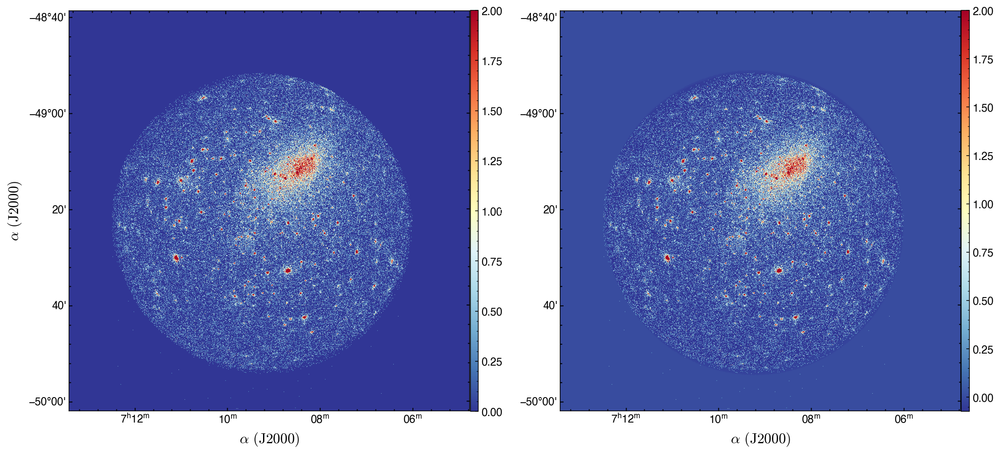

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
Set MJD-OBS to 58767.375556 from DATE-OBS.
Set MJD-END to 58767.957789 from DATE-END'. [astropy.wcs.wcs]


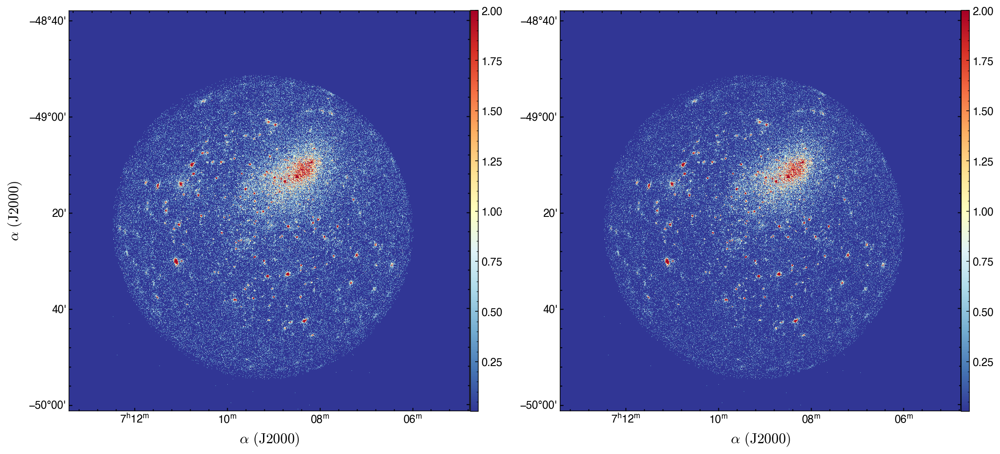

In [906]:
tm8 = fits.open('data/full_eband/tm8_cleaned_photon_image_corrected.fits')
tm9 = fits.open('data/full_eband/tm9_cleaned_photon_image_corrected.fits')

tm8_data = tm8[0].data.astype(float)
tm9_data = tm9[0].data.astype(float)

norm = LogNorm(vmin=0.03, vmax=6)


pl.subplot(121, projection=WCS(tm8[0].header))
pl.imshow(tm8_data, origin='lower', cmap='RdYlBu_r',vmax=2)
plt.colorbar(aspect=50, pad=0.002, fraction=0.0196)
pl.ylabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
pl.xlabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
pl.subplot(122, projection=WCS(tm8[0].header))
pl.imshow(tm8_data - pib_map, origin='lower', cmap='RdYlBu_r',vmax=2)
plt.colorbar(aspect=50, pad=0.002, fraction=0.0196)
pl.ylabel(r'$\rm \alpha\ (J2000)$', fontsize=16, color='w')
pl.xlabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
pl.subplots_adjust(right=2.3, top=1.8)
pl.show()

pl.subplot(121, projection=WCS(tm9[0].header))
pl.imshow(tm9_data, origin='lower', cmap='RdYlBu_r', vmin=0.0022, vmax=2)
plt.colorbar(aspect=50, pad=0.002, fraction=0.0196)
pl.ylabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
pl.xlabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
pl.subplot(122, projection=WCS(tm9[0].header))
pl.imshow(tm9_data - pib_map, origin='lower', cmap='RdYlBu_r', vmin=0.0022, vmax=2)
pl.subplots_adjust(right=2.3, top=1.8)
plt.colorbar(aspect=50, pad=0.002, fraction=0.0196)
pl.ylabel(r'$\rm \alpha\ (J2000)$', fontsize=16, color='w')
pl.xlabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
pl.subplots_adjust(right=2.3, top=1.8)
pl.show()

/var/folders/3d/y9v02zfn3jx0vssyx0tpsj000000gn/T/ipykernel_89716/3865642553.py:13: RuntimeWarning: divide by zero encountered in divide
  exp_corrected = (data - pib_map) / (exp_tm0 )
/var/folders/3d/y9v02zfn3jx0vssyx0tpsj000000gn/T/ipykernel_89716/3865642553.py:13: RuntimeWarning: invalid value encountered in divide
  exp_corrected = (data - pib_map) / (exp_tm0 )
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
Set MJD-OBS to 58767.375556 from DATE-OBS.
Set MJD-END to 58767.957789 from DATE-END'. [astropy.wcs.wcs]


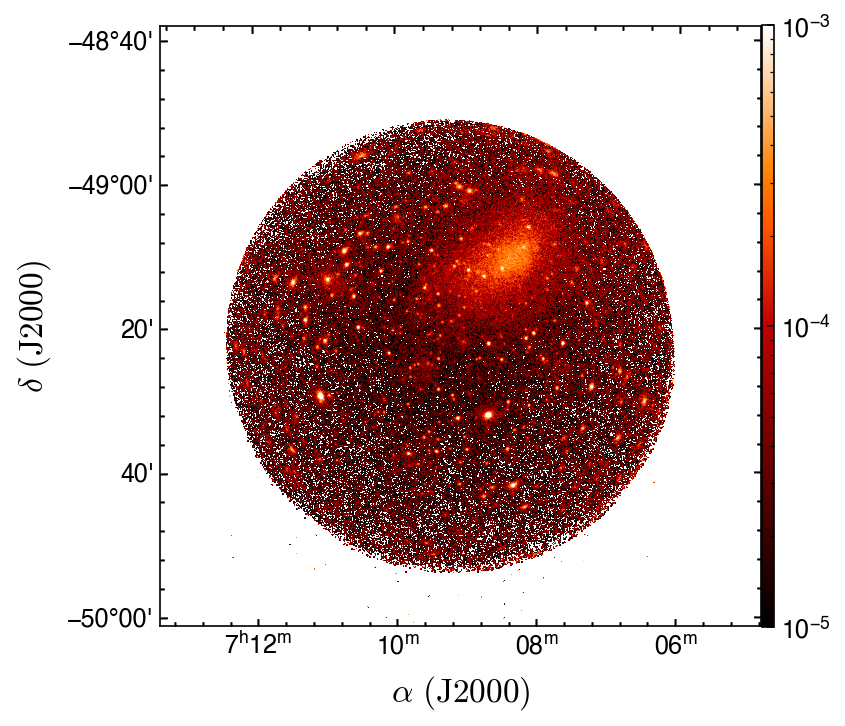

In [910]:
cr_pib_tm8 = np.sum(tm8[0].data - pib_map) / (tm8[1].header['TSTOP'] - tm8[1].header['TSTART'])

cr_pib_tm9 =np.sum(tm9[0].data - pib_map) / (tm9[1].header['TSTOP'] - tm9[1].header['TSTART'])

corr = cr_pib_tm9 / cr_pib_tm8

exp_tm8 = fits.open('data/full_eband/exposure_tm8_vignetted.fits')

exp_tm9 = fits.open('data/full_eband/exposure_tm9_vignetted.fits')

exp_tm0 = exp_tm8[0].data + corr*exp_tm9[0].data

exp_corrected = (data - pib_map) / (exp_tm0 )
pl.figure(figsize=(12, 10)) 

pl.subplot(133, projection=WCS(tm9[0].header))

pl.imshow(exp_corrected, origin='lower', norm=LogNorm(vmin=0.00001, vmax=0.001), cmap='gist_heat')

pl.colorbar(aspect=50, pad=0.002, fraction=0.0196)
pl.xlabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
pl.ylabel(r'$\rm \delta\ (J2000)$', fontsize=16)

pl.tight_layout()
pl.subplots_adjust(right=1.3, top=.9)
pl.savefig('figures/tm0_fully_corrected.pdf', format='pdf', dpi=150, bbox_inches='tight')
pl.show()

corrected_tm0_image = exp_corrected

fits.writeto('data/full_eband/tm0_exp_pib_corrected.fits', corrected_tm0_image, tm0_sband.header,  overwrite=True)

##### $\texttt{wavelet filtering}$

estimated noise standard deviation: 0.623
threshold: 3.326


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
Set MJD-OBS to 58767.375556 from DATE-OBS.
Set MJD-END to 58767.957789 from DATE-END'. [astropy.wcs.wcs]


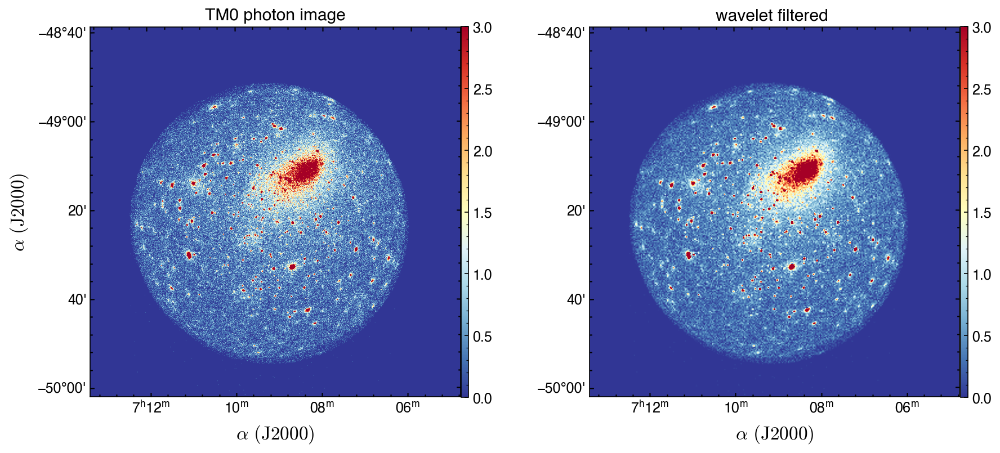

Filtered image saved to 'data/full_eband/tm0_wavelet_filtered.fits'


In [943]:
import pywt
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt


fits_file = "data/full_eband/tm0_sband_eventfile_cleaned.fits"  # Your X-ray image
try:
    with fits.open(fits_file) as hdul:
        # Find the image extension
        image_data = None
        header = None
        for hdu in hdul:
            if hdu.name == "IMAGE" or hdu.header.get('EXTNAME') == "IMAGE":
                image_data = hdu.data
                header = hdu.header
                break
            elif hdu.header.get('NAXIS') == 2:
                image_data = hdu.data
                header = hdu.header
                break

        if image_data is None:
            raise ValueError("No image extension found in the FITS file.")
except FileNotFoundError:
    print(f"Error: FITS file '{fits_file}' not found.")
    exit(1)

# wavelet and decomposition level
wavelet = 'db4'  # daubechies wavelet (db4 is a good default)
level = 2        # number of decomposition levels (adjust based on image size and features)

# perform the 2D wavelet transform
coeffs = pywt.wavedec2(image_data, wavelet=wavelet, level=level, mode='periodization')

'''
    - estimate noise level and set threshold
    - for Poisson noise in X-ray images, a simple approach is to use the standard deviation
    - of the detail coefficients at the finest scale
'''

detail_coeffs = coeffs[1:]  # skip the approximation coefficients (coeffs[0])

# flatten all detail coefficients to estimate noise

detail_flat = np.concatenate([c.flatten() for sublevel in detail_coeffs for c in sublevel])
noise_std = np.std(detail_flat)
print(f"estimated noise standard deviation: {noise_std:.3f}")

# universal threshold: threshold = sigma * sqrt(2 * log(N)), where N is the number of pixels
N = image_data.size
threshold = noise_std * np.sqrt(2 * np.log(N))
print(f"threshold: {threshold:.3f}")

# apply soft thresholding to detail coefficients
filtered_coeffs = [coeffs[0]]  # keep the approximation coefficients unchanged
for level_coeffs in detail_coeffs:  # process detail coefficients (horizontal, vertical, diagonal)
    filtered_level = tuple(
        pywt.threshold(c, threshold, mode='soft') for c in level_coeffs
    )
    filtered_coeffs.append(filtered_level)

# reconstruct the filtered image
filtered_image = pywt.waverec2(filtered_coeffs, wavelet=wavelet, mode='periodization')

# visualize the original and filtered images

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1, projection=WCS(header))
plt.imshow(image_data, cmap='RdYlBu_r', origin='lower', vmin=0, vmax=3)
plt.title('TM0 photon image')
pl.colorbar(aspect=50, pad=0.002, fraction=0.0196)
pl.ylabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
pl.xlabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
plt.subplot(1, 2, 2,  projection=WCS(header))
plt.imshow(filtered_image, cmap='RdYlBu_r', origin='lower', vmin=0, vmax=3)
plt.title('wavelet filtered ')
pl.colorbar(aspect=50, pad=0.002, fraction=0.0196)
pl.ylabel(r'$\rm \alpha\ (J2000)$', fontsize=16, color='w')
pl.xlabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
plt.tight_layout()
pl.savefig('figures/wavelet_filetered.pdf', format='pdf', dpi=150, bbox_inches='tight')
plt.show()

filtered_hdu = fits.PrimaryHDU(data=filtered_image, header=header)
filtered_hdu.writeto('data/full_eband/tm0_wavelet_filtered.fits', overwrite=True)
print("Filtered image saved to 'data/full_eband/tm0_wavelet_filtered.fits'")


##### $\texttt{source extration}$

/var/folders/3d/y9v02zfn3jx0vssyx0tpsj000000gn/T/ipykernel_89716/3369094919.py:20: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  cleaned_catalog = pd.read_csv('data/full_eband/backup.cat', comment='#', delim_whitespace=True, names=columns, skiprows=20, on_bad_lines='warn')
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
Set MJD-OBS to 58767.375556 from DATE-OBS.
Set MJD-END to 58767.957789 from DATE-END'. [astropy.wcs.wcs]


<Figure size 1200x1200 with 0 Axes>

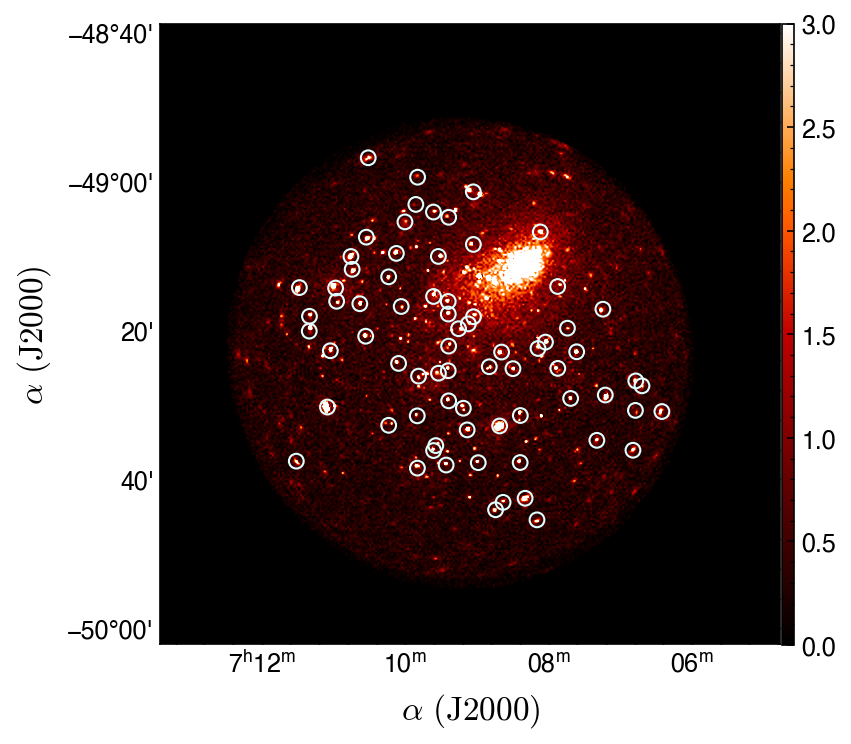

In [929]:
import pandas as pd

'''
 - here I copied the catalog from 
   SExtractor, cleaned it manually/visually and then created 
   a 2d mask of the cleaned catalog and re-ran SExtractor on it.
'''

columns = [
    'NUMBER', 'X_IMAGE', 'Y_IMAGE',
    'FLUX_APER_1', 'FLUX_APER_2',
    'FLUXERR_APER_1', 'FLUXERR_APER_2',
    'MAG_APER_1', 'MAG_APER_2',
    'MAGERR_APER_1', 'MAGERR_APER_2',
    'FLUX_AUTO', 'FLUXERR_AUTO',
    'MAG_AUTO', 'MAGERR_AUTO',
    'A_IMAGE', 'B_IMAGE', 'THETA_IMAGE', 'FWHM_IMAGE', 'FLAGS'
]

cleaned_catalog = pd.read_csv('data/full_eband/backup.cat', comment='#', delim_whitespace=True, names=columns, skiprows=20, on_bad_lines='warn')


pl.figure(figsize=(8, 8))
pl.figure(figsize=(12, 6))
pl.subplot(1, 2, 1, projection=WCS(header))
pl.imshow(filtered_image, cmap='gist_heat', origin='lower', vmin=0, vmax=3)
pl.colorbar(aspect=50, pad=0.002, fraction=0.0196)
pl.ylabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
pl.xlabel(r'$\rm \alpha\ (J2000)$', fontsize=16)

x_coords = cleaned_catalog['X_IMAGE']
y_coords = cleaned_catalog['Y_IMAGE']
pl.scatter(x_coords, y_coords, s=50, facecolors='none', edgecolors='lightcyan', label='Sources')

# for x, y in zip(x_coords, y_coords):
#     pl.text(x + 5, y + 5, f'({int(x)}, {int(y)})', fontsize=4, color='lightcyan')  # you can tweak the +5 offsets

plt.show()

with fits.open('data/full_eband/tm0_wavelet_filtered.fits') as hdu:
    image_shape = hdu[0].data.shape  # e.g., (1250, 1250)

mask = np.zeros(image_shape, dtype=np.int16)

mask_radius = 15 
for _, row in cleaned_catalog.iterrows():
    x, y = int(row['X_IMAGE'] - 1), int(row['Y_IMAGE'] - 1)  # Adjust for zero-based indexing
    y_indices, x_indices = np.ogrid[-mask_radius:mask_radius+1, -mask_radius:mask_radius+1]
    distance = np.sqrt(x_indices**2 + y_indices**2)
    mask_region = distance <= mask_radius
    y_start = max(0, y - mask_radius)
    y_end = min(image_shape[0], y + mask_radius + 1)
    x_start = max(0, x - mask_radius)
    x_end = min(image_shape[1], x + mask_radius + 1)
    mask[y_start:y_end, x_start:x_end][mask_region[:y_end-y_start, :x_end-x_start]] = 1

mask_hdu = fits.PrimaryHDU(mask)
mask_hdu.writeto('data/full_eband/mask_new.fits', overwrite=True)


/var/folders/3d/y9v02zfn3jx0vssyx0tpsj000000gn/T/ipykernel_89716/1134238597.py:14: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  cleaned_catalog = pd.read_csv('data/full_eband/backup.cat', comment='#', delim_whitespace=True, names=columns, skiprows=20, on_bad_lines='warn')
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
Set MJD-OBS to 58767.375556 from DATE-OBS.
Set MJD-END to 58767.957789 from DATE-END'. [astropy.wcs.wcs]


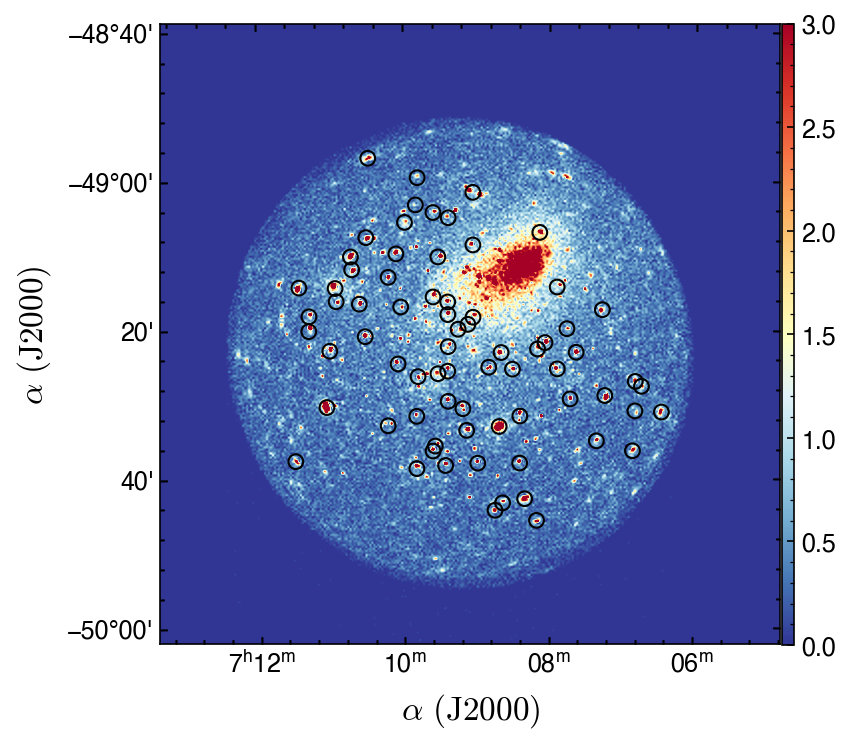

In [942]:
import pandas as pd

columns = [
    'NUMBER', 'X_IMAGE', 'Y_IMAGE',
    'FLUX_APER_1', 'FLUX_APER_2',
    'FLUXERR_APER_1', 'FLUXERR_APER_2',
    'MAG_APER_1', 'MAG_APER_2',
    'MAGERR_APER_1', 'MAGERR_APER_2',
    'FLUX_AUTO', 'FLUXERR_AUTO',
    'MAG_AUTO', 'MAGERR_AUTO',
    'A_IMAGE', 'B_IMAGE', 'THETA_IMAGE', 'FWHM_IMAGE', 'FLAGS'
]

cleaned_catalog = pd.read_csv('data/full_eband/backup.cat', comment='#', delim_whitespace=True, names=columns, skiprows=20, on_bad_lines='warn')

x_coords = cleaned_catalog['X_IMAGE']
y_coords = cleaned_catalog['Y_IMAGE']

pl.figure(figsize=(12, 6))
pl.subplot(1, 2, 1, projection=WCS(header))
pl.imshow(filtered_image, cmap='RdYlBu_r', origin='lower', vmin=0, vmax=3)
pl.colorbar(aspect=50, pad=0.002, fraction=0.0196)
pl.ylabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
pl.xlabel(r'$\rm \alpha\ (J2000)$', fontsize=16)

pl.scatter(cleaned_catalog['X_IMAGE']-1, cleaned_catalog['Y_IMAGE']-1, s=50, facecolors='none', edgecolors='k')
# for x, y in zip(x_coords, y_coords):
#     plt.text(x + 5, y + 5, f'({int(x)}, {int(y)})', fontsize=4, color='black') 
#pl.savefig('figures/coords.pdf', format='pdf', dpi=150, bbox_inches='tight')  
pl.show()



In [931]:
cheese_mask = np.ones(image_shape, dtype=np.int16)
for _, row in cleaned_catalog.iterrows():
    x, y = int(row['X_IMAGE'] - 1), int(row['Y_IMAGE'] - 1)
    mask_radius = int(np.sqrt((row['A_IMAGE'] - 1)**2 + (row['B_IMAGE'] - 1)**2))
    y_indices, x_indices = np.ogrid[-mask_radius:mask_radius+1, -mask_radius:mask_radius+1]
    distance = np.sqrt(x_indices**2 + y_indices**2)
    mask_region = distance <= mask_radius
    y_start = max(0, y - mask_radius)
    y_end = min(image_shape[0], y + mask_radius + 1)
    x_start = max(0, x - mask_radius)
    x_end = min(image_shape[1], x + mask_radius + 1)
    cheese_mask[y_start:y_end, x_start:x_end][mask_region[:y_end-y_start, :x_end-x_start]] = 0

cheese_hdu = fits.PrimaryHDU(cheese_mask, header=header)
cheese_hdu.writeto('tm0_cheese_corrected.fits', overwrite=True)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
Set MJD-OBS to 58767.375556 from DATE-OBS.
Set MJD-END to 58767.957789 from DATE-END'. [astropy.wcs.wcs]


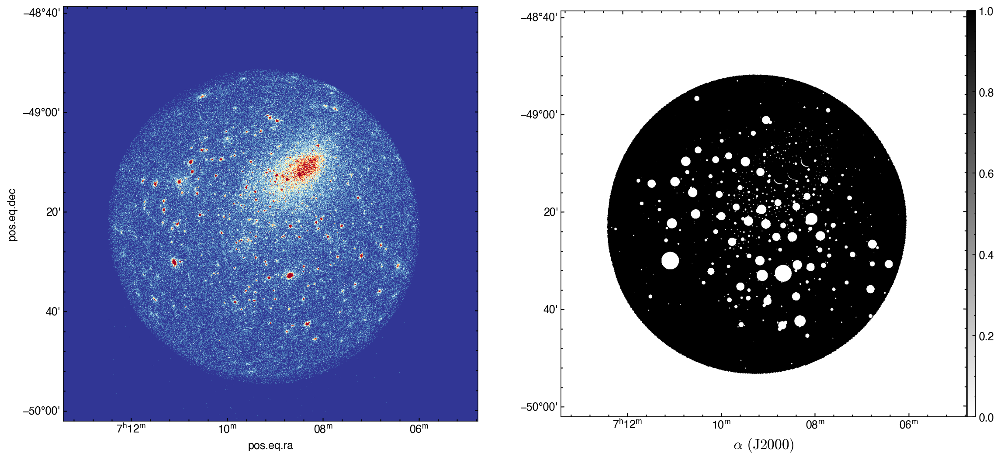

In [932]:
rm = fits.open('data/full_eband/tm0_cheesemask.fits')

pl.subplot(1, 2, 1, projection=WCS(header))
pl.imshow(image_data, origin='lower', cmap='RdYlBu_r', vmin=0, vmax=5)
pl.subplot(1, 2, 2, projection=WCS(header))
pl.imshow(rm[0].data, origin='lower', cmap='binary', vmin=0, vmax=1)
pl.colorbar(aspect=50, pad=0.002, fraction=0.0196)
pl.ylabel(r'$\rm \alpha\ (J2000)$', fontsize=16, color='w')
pl.xlabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
pl.subplots_adjust(right=2.3, top=1.8)
pl.show()

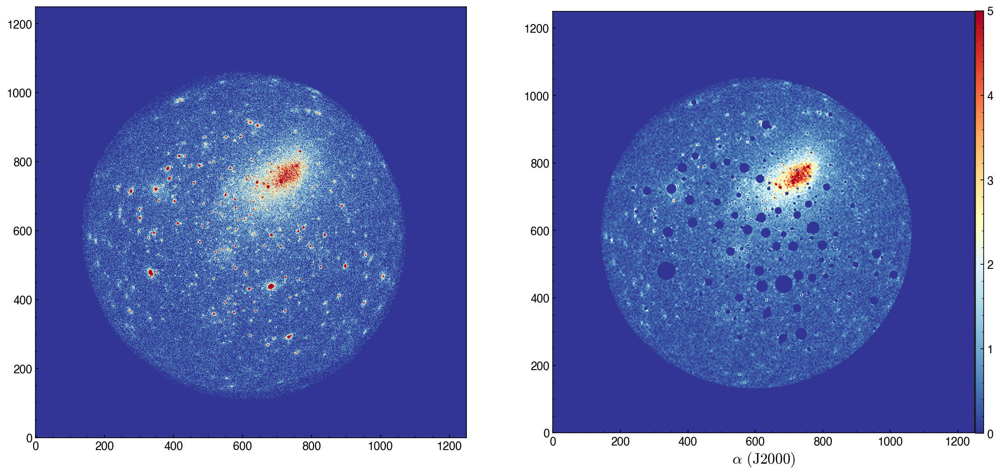

In [944]:
rm = fits.open('data/full_eband/tm0_cheesemask.fits')

coords = [(718, 750), (675, 737), (760, 790)] # removing masks in the X-ray peak region
radius = 25  # radius around the selected regions
cheese_mask_data = rm[0].data.copy()

for x_c, y_c in coords:
    y_indices, x_indices = np.ogrid[-radius:radius+1, -radius:radius+1]
    distance = np.sqrt(x_indices**2 + y_indices**2)
    unmask_region = distance <= radius
    y_start = max(0, y_c - radius)
    y_end = min(cheese_mask_data.shape[0], y_c + radius + 1)
    x_start = max(0, x_c - radius)
    x_end = min(cheese_mask_data.shape[1], x_c + radius + 1)
    cheese_mask_data[y_start:y_end, x_start:x_end][unmask_region[:y_end-y_start, :x_end-x_start]] = 1

rm[0].data = cheese_mask_data

rm.flush()
rm.close()
pl.subplot(1, 2, 1)
pl.imshow(image_data, origin='lower', cmap='RdYlBu_r', vmin=0, vmax=5)
pl.subplot(1, 2, 2)
pl.imshow(filtered_image*rm[0].data, origin='lower', cmap='RdYlBu_r', vmin=0, vmax=5)


pl.colorbar(aspect=50, pad=0.002, fraction=0.0196)
pl.ylabel(r'$\rm \alpha\ (J2000)$', fontsize=16, color='w')
pl.xlabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
pl.subplots_adjust(right=2.3, top=1.8)
pl.savefig('figures/tm0_cheesemask_applied.pdf', format='pdf', dpi=150, bbox_inches='tight')
pl.show()

fits.writeto('data/full_eband/wavelet_filtered_cheesemask_applied.fits', filtered_image*rm[0].data, header, overwrite=True)

Set OBSGEO-B to   -30.713200 from OBSGEO-[XYZ].
Set OBSGEO-H to     1046.994 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
Set MJD-OBS to 58767.375556 from DATE-OBS.
Set MJD-END to 58767.957789 from DATE-END'. [astropy.wcs.wcs]


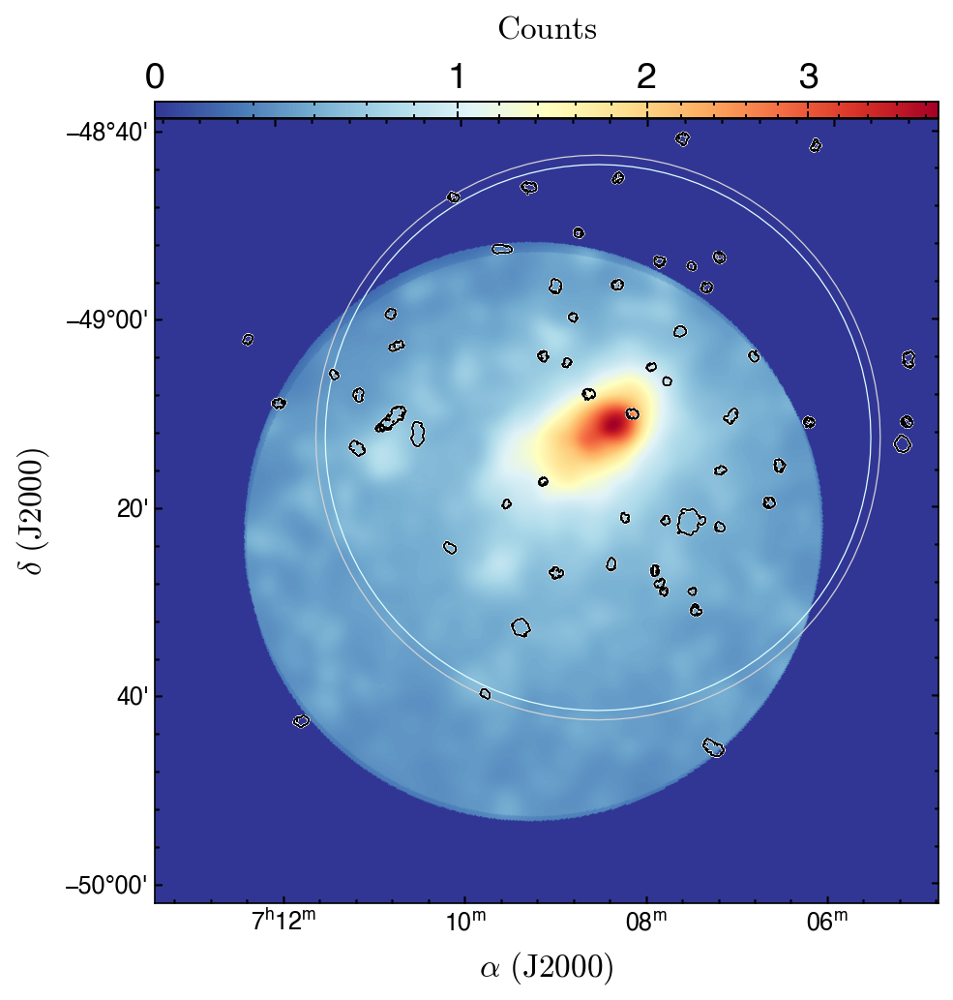

In [962]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from reproject import reproject_interp
from astropy.visualization.wcsaxes import SphericalCircle
from astropy.coordinates import SkyCoord
from astropy.visualization import PowerStretch, ImageNormalize

norm = ImageNormalize(stretch=PowerStretch(0.7))

# Step 1: Load the FITS files
# Replace 'hi_image.fits' and 'xray_image.fits' with your actual file paths
hi_hdu = fits.open('data/full_eband/cluster_dilated_mom0.fits')[0]  # HI image (2600x2600)
xray_hdu = fits.open('data/full_eband/tm0_background.fits')[0]  # X-ray image (1250x1250)

# Extract data and WCS
hi_data = hi_hdu.data
hi_wcs = WCS(hi_hdu.header, naxis=2)
xray_data = xray_hdu.data
xray_wcs = WCS(xray_hdu.header)

# Step 2: Reproject the HI data to match the X-ray image's WCS and shape
# reproject_interp returns the reprojected data and a footprint (where data is valid)
hi_reprojected, footprint = reproject_interp(
    (hi_data, hi_wcs),  # Input data and WCS
    xray_wcs,  # Target WCS (X-ray)
    shape_out=xray_data.shape  # Target shape (1250x1250)
)

# Step 3: Create the plot
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection=xray_wcs)

#img = ax.imshow(xray_data, origin='lower', cmap='RdYlBu_r', vmin=np.nanpercentile(xray_data, 5), vmax=np.nanpercentile(xray_data, 95))
img = ax.imshow(xray_data, origin='lower', cmap='RdYlBu_r', norm=norm)
divider = make_axes_locatable(ax)
cax2 = divider.new_vertical(size='2%', pad=0.01)
fig.add_axes(cax2)
cb = plt.colorbar(img, cax=cax2, orientation='horizontal')
cax2.grid(False)
cax2.tick_params(direction='in', labelsize=18)
cax2.coords[0].set_ticklabel_position('t')
cax2.coords[0].set_axislabel_position('t')
cax2.coords[1].set_ticks(alpha=0, color='w', size=0, values=[]*u.dimensionless_unscaled)
cax2.coords[0].set_axislabel(r'$\rm Counts $', fontsize=16)

center = SkyCoord(ra=ra, dec=dec)

r_vir = SphericalCircle((center.ra, center.dec),
                        58/2 * u.arcmin,
                        edgecolor='lightcyan', facecolor='none',
                        transform=ax.get_transform('fk5'),
                        ls='-', linewidth=0.6)
ax.add_patch(r_vir)

beam = SphericalCircle((center.ra, center.dec),
                       30 * u.arcmin,
                       edgecolor='lightgrey', facecolor='none',
                       transform=ax.get_transform('fk5'),
                       ls='-', linewidth=0.6)
ax.add_patch(beam)

# step 4: Overlay HI contours
levels=[0.5, 1.5, 2.5, 3.5, 4.5]
ax.contour(hi_reprojected, levels=levels, colors='w', linewidths=1.2)
ax.contour(hi_reprojected, levels=levels, colors='k', linewidths=.6)

ax.set_xlabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
ax.set_ylabel(r'$\rm \delta\ (J2000)$', fontsize=16)

pl.subplots_adjust(right=1.3, top=.8)
pl.savefig('figures/adapt_smoothed_background.pdf', format='pdf', dpi=150, bbox_inches='tight')
pl.show()

In [ ]:
from astropy.io import fits
from astropy.table import Table
import numpy as np
from astropy.coordinates import SkyCoord
import astropy.units as u

# Load the boxlist
boxlist = Table.read('data/full_eband/tm0_boxlist_local.fits')

# Load the SExtractor catalog as ASCII
sextractor = pd.read_csv('data/full_eband/sources_corrected.cat', comment='#', delim_whitespace=True, names=columns, skiprows=20, on_bad_lines='warn')

# Create arrays for both catalogs' X,Y positions
boxlist_xy = np.array([boxlist['x_ima'], boxlist['y_ima']]).T
sextractor_xy = np.array([sextractor['X_IMAGE'], sextractor['Y_IMAGE']]).T

# Create a mask to track matching sources
mask = np.zeros(len(boxlist), dtype=bool)

# Define matching radius in pixels
match_radius = 1.5  # adjust based on your needs

# Find matches using a simple distance calculation
for i, (x_box, y_box) in enumerate(boxlist_xy):
    distances = np.sqrt((sextractor_xy[:,0] - x_box)**2 + (sextractor_xy[:,1] - y_box)**2)
    if np.min(distances) <= match_radius:
        mask[i] = True

# Create a new boxlist with only the matching sources
filtered_boxlist = boxlist[mask]

# Write the filtered boxlist to a new file
filtered_boxlist.write('data/full_eband/tm0_filtered_boxlist.fits', overwrite=True)

# Print some stats
print(f"Original boxlist: {len(boxlist)} sources")
print(f"Filtered boxlist: {len(filtered_boxlist)} sources")
print(f"Removed {len(boxlist) - len(filtered_boxlist)} sources")

### skytiles

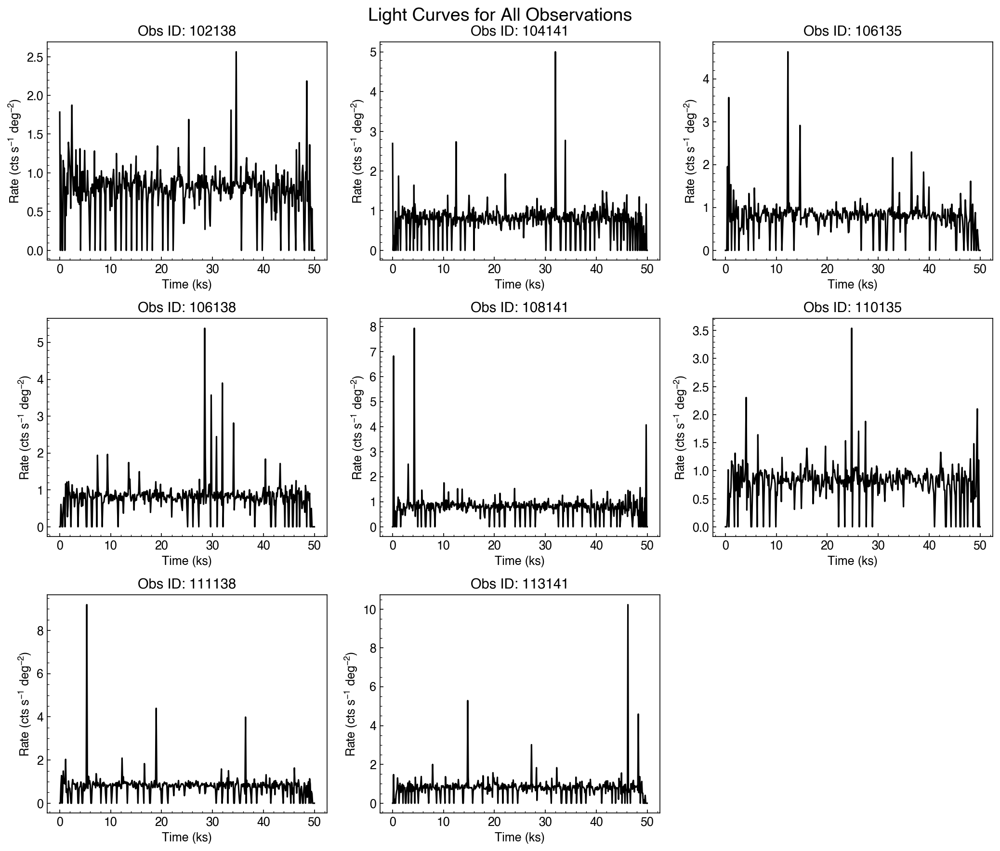

In [1003]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits

# Directory containing the light curve files
light_curve_dir = 'data/skytile_data/full_eband/light_curves'
figure_dir = 'figures'
os.makedirs(figure_dir, exist_ok=True)

# Get all light curve files
light_curve_files = sorted(glob.glob(os.path.join(light_curve_dir, 'light_curve_em01_*_020_EventList_c010_full_band.fits')))

# Set up the figure with subplots
fig, axes = plt.subplots(3, 3, figsize=(14, 12))
axes = axes.flatten()  # Flatten to make indexing easier
fig.delaxes(axes[8])

for i, lc_file in enumerate(light_curve_files):

    obs_id = os.path.basename(lc_file).split('_')[3]
    
    with fits.open(lc_file) as hdul:
        rate_data = hdul[1].data['RATE']
        time_data = np.linspace(0, 50, len(rate_data))
    
    ax = axes[i]
    ax.plot(time_data, rate_data, 'k-')
    
    ax.set_title(f'Obs ID: {obs_id}', fontsize=14)
    ax.set_xlabel(r'Time (ks)', fontsize=12)
    ax.set_ylabel(r'Rate (cts $s^{-1}$ $deg^{-2}$)', fontsize=12)

for i in range(len(light_curve_files), 8):
    fig.delaxes(axes[i])

plt.tight_layout()
fig.suptitle('Light Curves for All Observations', fontsize=18, y=0.98)
plt.subplots_adjust(top=0.94)

plt.show()

1.2448730055398027, 102138
1.2438511876568623, 104141
1.2344046657096568, 106135
1.2429232583379708, 106138
1.2438354511705738, 108141
1.317289102404949, 110135
1.2558096423711835, 111138
1.2494132089315557, 113141


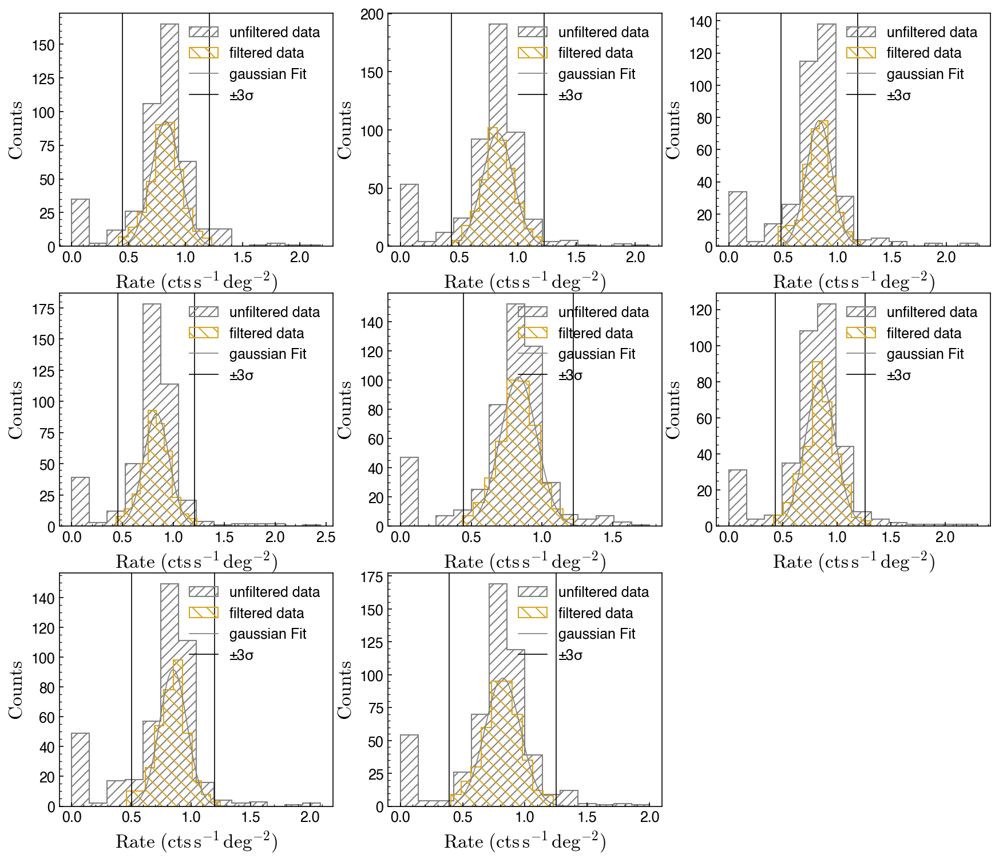

In [1018]:
import numpy as np
import matplotlib.pyplot as pl
from scipy.optimize import curve_fit
from astropy.io import fits

def func(x, a, x0, sigma):
    return a * np.exp(-(x - x0)**2 / (2 * sigma**2))


# Get all light curve files
light_curve_files = sorted(glob.glob(os.path.join(light_curve_dir, 'light_curve_em01_*_020_EventList_c010_full_band.fits')))

# Set up the figure with subplots
fig, axes = plt.subplots(3, 3, figsize=(14, 12))
axes = axes.flatten()  # Flatten to make indexing easier
fig.delaxes(axes[8])

for i, lc_file in enumerate(light_curve_files):

    obs_id = os.path.basename(lc_file).split('_')[3]
    
    with fits.open(lc_file) as hdul:
        rate_data = hdul[1].data['RATE']

        mask = (rate_data >= 0.) & (rate_data <= 2.5)

        rate_data = rate_data[mask]
    
    ax = axes[i]

    bins = np.linspace(np.min(rate_data), np.max(rate_data), 15)
    hist = ax.hist(rate_data, bins=bins, histtype='stepfilled',
                    fill=False, edgecolor='grey', hatch='///', label='unfiltered data')
    x, y = (hist[1][1:] + hist[1][:-1]) / 2, hist[0]

    a, x0, sig = np.max(y), np.mean(x), np.std(x)
    popt, cov = curve_fit(func, x, y, p0=[a, x0, sig])

    a_new, x0_new, sig_new = np.max(y), np.mean(x), np.std(x)
    popt_new, cov_new = curve_fit(func, x, y, p0=[a, x0, sig])
    x_mock = np.linspace(np.min(x), np.max(x) , 1000)


    lower_bound = popt[1] - 3 * popt[-1]
    upper_bound = popt[1] + 3 * popt[-1]

    # filter RATE data within 3σ
    mask = (rate_data >= lower_bound) & (rate_data <= upper_bound)
    filtered_rate = rate_data[mask]

    print(f'{upper_bound}, {obs_id}')

    bins = np.linspace(np.min(filtered_rate), np.max(filtered_rate), 12)
    hist_filtered = ax.hist(filtered_rate, bins=10, histtype='stepfilled',
                    fill=False, edgecolor='goldenrod', hatch='\\\\', label='filtered data')
    x_filtered, y_filtered = (hist_filtered[1][1:] + hist_filtered[1][:-1]) / 2, hist_filtered[0]

    a_new, x0_new, sig_new = np.max(y_filtered), np.mean(x_filtered), np.std(x_filtered)
    popt_new, cov_new = curve_fit(func, x_filtered, y_filtered, p0=[a_new, x0_new, sig_new])

    # Plot the new fit
    x_mock = np.linspace(np.min(x_filtered), np.max(x_filtered) + 0.3, 1000)
    ax.plot(x_mock, func(x_mock, *popt_new), ls='-', color='grey', linewidth=0.8, label='gaussian Fit')
    ax.axvline(popt_new[1] + 3 * popt_new[-1], color='k', linewidth=0.8, ls='-', label='±3σ')
    ax.axvline(popt_new[1] - 3 * popt_new[-1], color='k', linewidth=0.8, ls='-')
    ax.set_xlabel(r'$\rm Rate\ (cts\,s^{-1}\,deg^{-2})$', fontsize=16)
    ax.set_ylabel(r'$\rm Counts$', fontsize=16)
    ax.legend(frameon=False, fontsize=12)
pl.show()

In [1027]:
import os
from astropy.io import fits

# List of FITS files
fits_files = [
    "em01_102138_020_EventList_c010_full_band_full_band_cleaned.fits",
    "em01_110135_020_EventList_c010_full_band_full_band_cleaned.fits",
    "em01_106135_020_EventList_c010_full_band_full_band_cleaned.fits",
    "em01_106138_020_EventList_c010_full_band_full_band_cleaned.fits",
    "em01_108141_020_EventList_c010_full_band_full_band_cleaned.fits",
    "em01_104141_020_EventList_c010_full_band_full_band_cleaned.fits",
    "em01_113141_020_EventList_c010_full_band_full_band_cleaned.fits",
    "em01_111138_020_EventList_c010_full_band_full_band_cleaned.fits",
]

# Directory containing the FITS files (adjust as needed)
input_dir = "data/skytile_data/full_eband"
output_dir = input_dir  # Save in the same directory

# New FLAGSEL value and comment
new_flagsel_value = -1072693456
flagsel_comment = "Flag selection: 0xC000F000"

# Ensure output directory exists
os.makedirs(output_dir, exist_ok=True)

# Process each FITS file
for fits_file in fits_files:
    input_path = os.path.join(input_dir, fits_file)
    
    # Check if file exists
    if not os.path.exists(input_path):
        print(f"Warning: File {input_path} not found. Skipping...")
        continue
    
    # Open the FITS file
    with fits.open(input_path, mode='update') as hdul:
        updated = False
        # Update FLAGSEL in all HDUs
        for i, hdu in enumerate(hdul):
            if 'FLAGSEL' in hdu.header:
                old_value = hdu.header['FLAGSEL']
                hdu.header['FLAGSEL'] = (new_flagsel_value, flagsel_comment)
                print(f"Updated FLAGSEL in {fits_file} (HDU {i}): {old_value} -> {new_flagsel_value}")
                updated = True
            else:
                hdu.header['FLAGSEL'] = (new_flagsel_value, flagsel_comment)
                print(f"Added FLAGSEL in {fits_file} (HDU {i}): {new_flagsel_value}")
                updated = True
        
        if not updated:
            print(f"Warning: No FLAGSEL updated in {fits_file} (no HDUs found).")
        
        # Define output file path (add _updated suffix)
        output_file = os.path.splitext(fits_file)[0] + "_updated.fits"
        output_path = os.path.join(output_dir, output_file)
        
        # Save the modified FITS file
        try:
            hdul.writeto(output_path, overwrite=True)
            print(f"Saved updated file: {output_path}")
        except Exception as e:
            print(f"Error saving {output_path}: {e}")
        
        # Verify FLAGSEL values in the saved file
        with fits.open(output_path) as verify_hdul:
            for i, hdu in enumerate(verify_hdul):
                if 'FLAGSEL' in hdu.header:
                    value = hdu.header['FLAGSEL']
                    comment = hdu.header.comments['FLAGSEL']
                    print(f"Verified FLAGSEL in {output_file} (HDU {i}): {value}, Comment: {comment}")
                else:
                    print(f"Warning: FLAGSEL not found in {output_file} (HDU {i}) after saving.")

print("All files processed.")

Updated FLAGSEL in em01_102138_020_EventList_c010_full_band_full_band_cleaned.fits (HDU 0): -1072693456 -> -1072693456
Updated FLAGSEL in em01_102138_020_EventList_c010_full_band_full_band_cleaned.fits (HDU 1): -535822544 -> -1072693456
Updated FLAGSEL in em01_102138_020_EventList_c010_full_band_full_band_cleaned.fits (HDU 2): -535822544 -> -1072693456
Updated FLAGSEL in em01_102138_020_EventList_c010_full_band_full_band_cleaned.fits (HDU 3): -535822544 -> -1072693456
Updated FLAGSEL in em01_102138_020_EventList_c010_full_band_full_band_cleaned.fits (HDU 4): -535822544 -> -1072693456
Updated FLAGSEL in em01_102138_020_EventList_c010_full_band_full_band_cleaned.fits (HDU 5): -535822544 -> -1072693456
Updated FLAGSEL in em01_102138_020_EventList_c010_full_band_full_band_cleaned.fits (HDU 6): -535822544 -> -1072693456
Updated FLAGSEL in em01_102138_020_EventList_c010_full_band_full_band_cleaned.fits (HDU 7): -535822544 -> -1072693456
Updated FLAGSEL in em01_102138_020_EventList_c010_full_

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
Set MJD-OBS to 58953.551088 from DATE-OBS.
Set MJD-END to 58977.383310 from DATE-END'. [astropy.wcs.wcs]


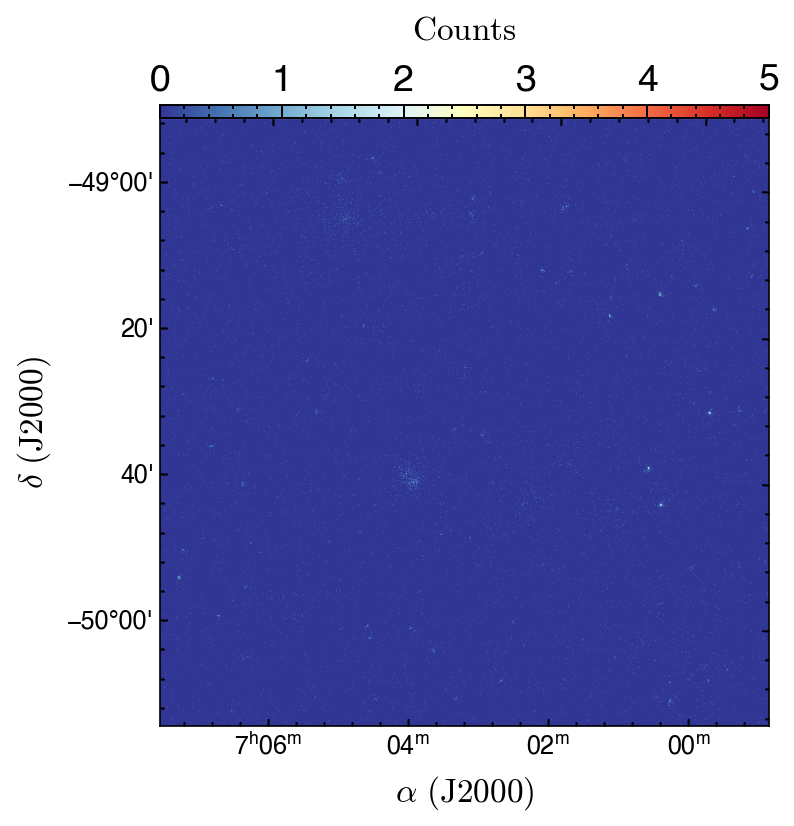

In [996]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from astropy.visualization import PowerStretch, ImageNormalize, LogStretch

cleaned_tm0 = fits.open('data/skytiles/cleaned/tm0_skytiles_full_eband.fits')
data = cleaned_tm0[0].data.astype(float)
wcs = WCS(cleaned_tm0[0].header)

fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(1, 1, 1, projection=wcs)

img = ax.imshow(data, origin='lower',cmap='RdYlBu_r')

divider = make_axes_locatable(ax)
cax2 = divider.new_vertical(size='2%', pad=0.001)
fig.add_axes(cax2)
cb = plt.colorbar(img, cax=cax2, orientation='horizontal')
cax2.grid(False)
cax2.tick_params(direction='in', labelsize=18)
cax2.coords[0].set_ticklabel_position('t')
cax2.coords[0].set_axislabel_position('t')
cax2.coords[1].set_ticks(alpha=0, color='w', size=0, values=[]*u.dimensionless_unscaled)
cax2.coords[0].set_axislabel(r'$\rm Counts $', fontsize=16)

ax.set_xlabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
ax.set_ylabel(r'$\rm \delta\ (J2000)$', fontsize=16)
pl.subplots_adjust(right=1.3, top=.8)
#pl.savefig('figures/tm0_cleaned_photon_image.pdf', format='pdf', dpi=150, bbox_inches='tight')
pl.show()

Set OBSGEO-B to   -30.713200 from OBSGEO-[XYZ].
Set OBSGEO-H to     1046.994 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
Set MJD-OBS to 58767.375556 from DATE-OBS.
Set MJD-END to 58983.550625 from DATE-END'. [astropy.wcs.wcs]


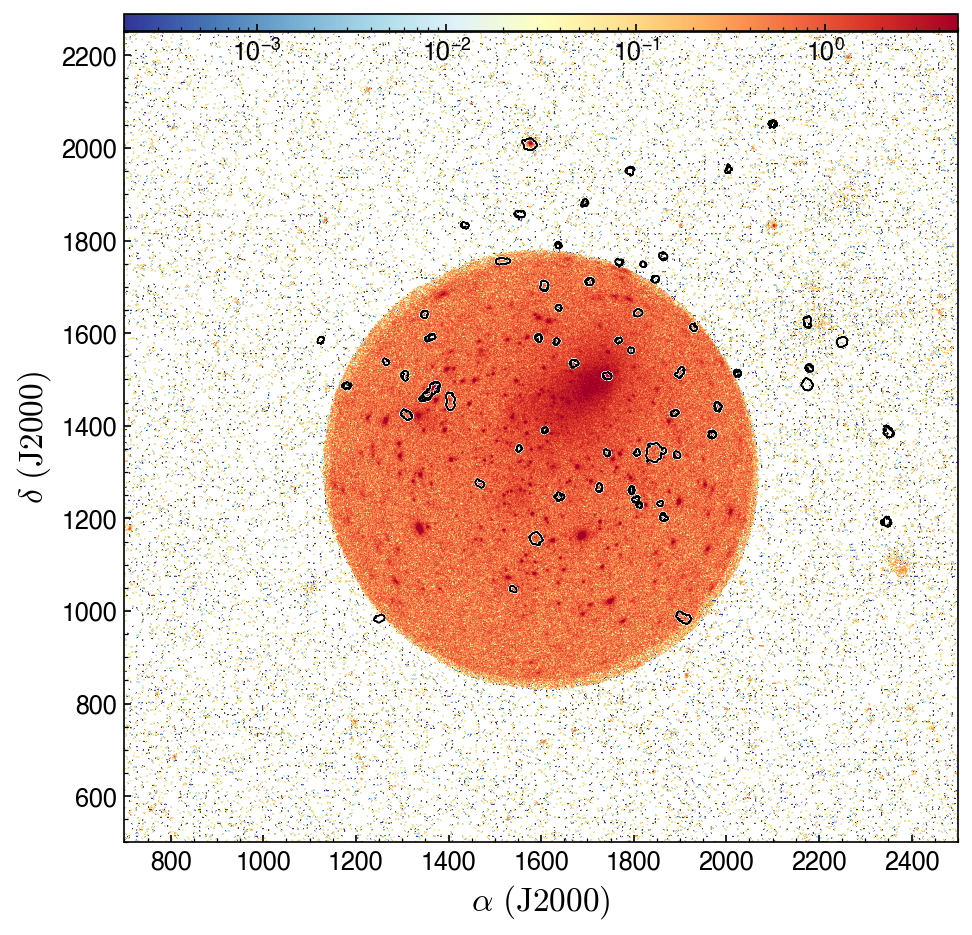

In [1050]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from reproject import reproject_interp
from astropy.visualization.wcsaxes import SphericalCircle
from astropy.coordinates import SkyCoord

# Step 1: Load the FITS files
# Replace 'hi_image.fits' and 'xray_image.fits' with your actual file paths
hi_hdu = fits.open('data/full_eband/cluster_dilated_mom0.fits')[0]  # HI image (2600x2600)
xray_hdu = fits.open('data/skytile_data/full_eband/mosaic.fits')[0]  # X-ray image (1250x1250)

# Extract data and WCS
hi_data = hi_hdu.data
hi_wcs = WCS(hi_hdu.header, naxis=2)
xray_data = xray_hdu.data
xray_wcs = WCS(xray_hdu.header)

# Step 2: Reproject the HI data to match the X-ray image's WCS and shape
# reproject_interp returns the reprojected data and a footprint (where data is valid)
hi_reprojected, footprint = reproject_interp(
    (hi_data, hi_wcs),  # Input data and WCS
    xray_wcs,  # Target WCS (X-ray)
    shape_out=xray_data.shape  # Target shape (1250x1250)
)

# Step 3: Create the plot
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)#, projection=xray_wcs)

#img = ax.imshow(xray_data, origin='lower', cmap='RdYlBu_r', vmin=np.nanpercentile(xray_data, 5), vmax=np.nanpercentile(xray_data, 95))
img = ax.imshow(xray_data, origin='lower', cmap='RdYlBu_r', norm=LogNorm(vmin=0.0002, vmax=5))
divider = make_axes_locatable(ax)
cax2 = divider.new_vertical(size='2%', pad=0.01)
fig.add_axes(cax2)
cb = plt.colorbar(img, cax=cax2, orientation='horizontal')
cax2.grid(False)
# cax2.tick_params(direction='in', labelsize=18)
# cax2.coords[0].set_ticklabel_position('t')
# cax2.coords[0].set_axislabel_position('t')
# cax2.coords[1].set_ticks(alpha=0, color='w', size=0, values=[]*u.dimensionless_unscaled)
# cax2.coords[0].set_axislabel(r'$\rm Counts $', fontsize=16)

center = SkyCoord(ra=ra, dec=dec)

# r_vir = SphericalCircle((center.ra, center.dec),
#                         58/2 * u.arcmin,
#                         edgecolor='lightcyan', facecolor='none',
#                         transform=ax.get_transform('fk5'),
#                         ls='-', linewidth=0.6)
# ax.add_patch(r_vir)

# beam = SphericalCircle((center.ra, center.dec),
#                        30 * u.arcmin,
#                        edgecolor='lightgrey', facecolor='none',
#                        transform=ax.get_transform('fk5'),
#                        ls='-', linewidth=0.6)
# ax.add_patch(beam)

# step 4: Overlay HI contours
levels=[0.5, 1.5, 2.5, 3.5, 4.5]
ax.contour(hi_reprojected, levels=levels, colors='w', linewidths=1.2)
ax.contour(hi_reprojected, levels=levels, colors='k', linewidths=.6)

ax.set_xlabel(r'$\rm \alpha\ (J2000)$', fontsize=16)
ax.set_ylabel(r'$\rm \delta\ (J2000)$', fontsize=16)
ax.set_xlim(700, 2500)
ax.set_ylim(500, 2250)

pl.subplots_adjust(right=1.3, top=.8)
pl.savefig('figures/hi_overlayed_xray.pdf', format='pdf', dpi=150, bbox_inches='tight')
pl.show()
